In [1]:
%pylab inline
import jax
import jax.numpy as jnp

Populating the interactive namespace from numpy and matplotlib


Data and VAE prepraretion

In [2]:
# Let's start with the imports
import haiku as hk     # NN library
import optax           # Optimizer library
import pickle

# Utility function for tensoboard
from flax.metrics import tensorboard

# TensorFlow probability
from tensorflow_probability.substrates import jax as tfp
tfd = tfp.distributions
tfb = tfp.bijectors

# Specific models built by EiffL
from quarks2cosmos.models.vae import Decoder
from quarks2cosmos.models.flow import AffineFlow

In [3]:
rng_seq = hk.PRNGSequence(42)
from jax import random

In [4]:
import pickle
with open('/ocean/projects/cis210053p/shared/deep_inverse/models/resvae2/model-50000.pckl', 'rb') as file:
    params, state, _ = pickle.load(file)
with open('/ocean/projects/cis210053p/shared/deep_inverse/models/flowResnet2/model-20000.pckl', 'rb') as file:
    params_flow, _ = pickle.load(file)    
    
params = hk.data_structures.merge(params, params_flow)
params_1 = hk.data_structures.merge(params, params_flow)

In [5]:
def generative_model_fn(z):
    # Transform from Gaussian space to VAE latent space
    z1 = AffineFlow()().bijector.forward(z)
    
    # Decode sample with decoder
    likelihood = Decoder()(z1, is_training=False)
    
    return likelihood.mean()

generative_model = hk.without_apply_rng(hk.transform_with_state(generative_model_fn))

In [6]:
import quarks2cosmos.datasets
import tensorflow_datasets as tfds
from quarks2cosmos import galjax as gj

In [7]:
dset_cosmos = tfds.load("Cosmos/23.5", split=tfds.Split.TRAIN) # Load the TRAIN split
dset_cosmos = dset_cosmos.as_numpy_iterator()                  # Convert the dataset to numpy iterator

dset_hsc = tfds.load("HSC", split=tfds.Split.TRAIN)
dset_hsc = dset_hsc.as_numpy_iterator()

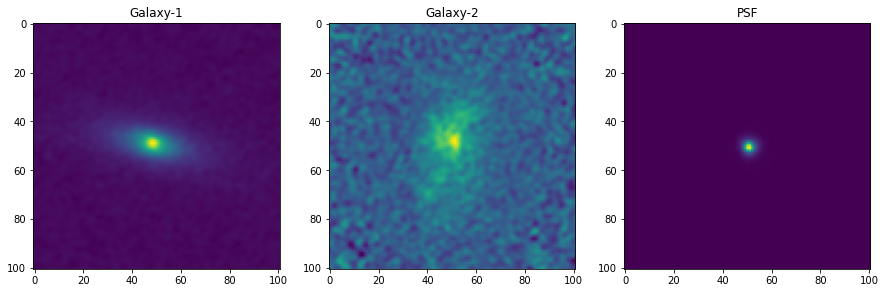

In [37]:
# Extract a new example from the dataset
cosmos1 = next(dset_cosmos)
cosmos2 = next(dset_cosmos)

figure(figsize=[15,5])
subplot(131)
imshow(cosmos1['image'])
title('Galaxy-1')
subplot(132)
imshow(cosmos2['image'])
title('Galaxy-2')
subplot(133)
imshow(cosmos1['psf'])
title('PSF');

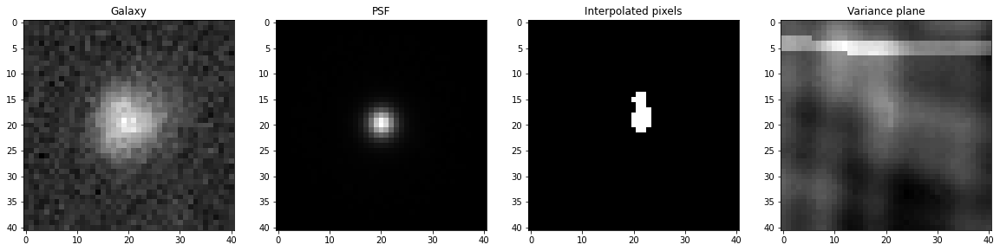

In [33]:
# Extract a new example from the dataset
hsc = next(dset_hsc)

figure(figsize=[20,5])
subplot(141)
imshow(hsc['image'],cmap='gray')
title('Galaxy')
subplot(142)
imshow(hsc['psf'],cmap='gray')
title('PSF')
subplot(143)
imshow(hsc['mask'] == 44,cmap='gray')
title('Interpolated pixels')
subplot(144)
imshow(hsc['variance'],cmap='gray')
title('Variance plane');

In [10]:
@jax.jit
def simulate_hsc(x, in_psf, out_psf):
    """ This function will simulate an image at HSC resolution given an image at HST resolution,
    accounting for input PSF and convolving by output PSF
    Args:
        x: HST resolution image (MUST BE ODD SIZE!!!!)
        in_psf: HST PSF
        out_psf: HSC PSF
    Returns:
        y: HSC simulated image of size [41,41]
    """
    y = gj.deconvolve(x, in_psf)         # Deconvolve by input PSF
    y = gj.kresample(y, 0.03, 0.168, 41) # Resample image to HSC grid
    y = gj.convolve(y,  out_psf)         # Reconvolve by HSC PSF
    return 2.587*y                       # Conversion factor for the flux

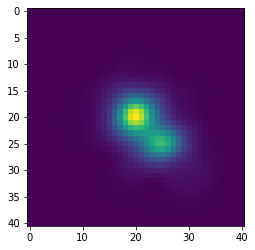

In [11]:
import matplotlib.pyplot as plt
@jax.jit
def blendingHSC(x1,x2):
    im_hsc1 = simulate_hsc(x1, cosmos1['psf'], hsc['psf'])
    im_hsc2 = simulate_hsc(x2, cosmos2['psf'], hsc['psf'])
    im_hsc2 = jnp.roll(jnp.roll(im_hsc2, 5, axis=1), 5, axis=0)
    im_blended = im_hsc1 + im_hsc2
    likelihood = tfd.Independent(tfd.Normal(loc=im_blended,
                                        scale=jnp.sqrt(hsc['variance'])), 
                             reinterpreted_batch_ndims=2) 
    return likelihood.mean()

blended=blendingHSC(cosmos1['image'],cosmos2['image'])
plt.imshow(blended)

In [12]:
likelihood = tfd.Independent(tfd.Normal(loc=blended,
                                        scale=jnp.sqrt(hsc['variance'])), 
                             reinterpreted_batch_ndims=2)

In [13]:
im_noise = likelihood.sample(seed=jax.random.PRNGKey(1))
x1_true = cosmos1['image']
x2_true = cosmos2['image']
cr_mask = 1.*(hsc['mask'] == 44)
y_obs = im_noise * (1 - cr_mask)

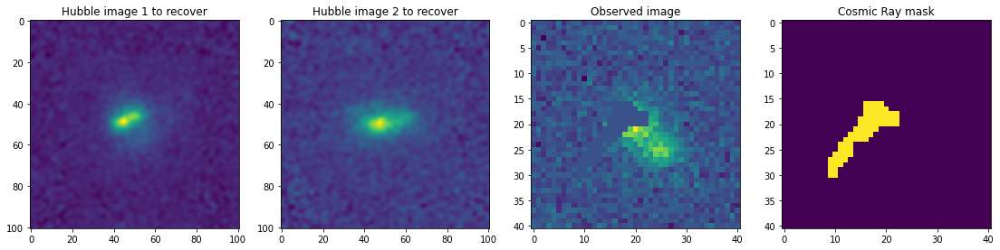

In [14]:
figure(figsize=[19,5])
subplot(141)
imshow(x1_true)
title('Hubble image 1 to recover')
subplot(142)
imshow(x2_true)
title('Hubble image 2 to recover')
subplot(143)
imshow(y_obs)
title('Observed image')
subplot(144)
imshow(cr_mask)
title('Cosmic Ray mask');

#### The MAP solution

In [15]:
# our forward model
@jax.jit
def blending(z1, z2):
    im1, _ = generative_model.apply(params, state, z1)
    im2, _ = generative_model.apply(params, state, z2)
    im_hsc1 = simulate_hsc(im1[0], cosmos1['psf'], hsc['psf'])
    im_hsc2 = simulate_hsc(im2[0], cosmos2['psf'], hsc['psf'])
    im_hsc2 = jnp.roll(jnp.roll(im_hsc2, 5, axis=1), 5, axis=0)
    im_blended = im_hsc1 + im_hsc2
    likelihood = tfd.Independent(tfd.Normal(loc=im_blended,
                                        scale=jnp.sqrt(hsc['variance'])), 
                             reinterpreted_batch_ndims=2) 
    return likelihood.mean()

In [37]:
#our posterior probability
@jax.jit
def log_probz(z):
    x=blending(z[0:32],z[32:64])
    prior=tfd.Independent(tfd.Normal(jnp.zeros(64), jnp.zeros(64)+1), # We add a high noise component in mask
                             reinterpreted_batch_ndims=1)
    likelihood = tfd.Independent(tfd.Normal(x,
                                            jnp.sqrt(hsc['variance'] + cr_mask*1e3)), # We add a high noise component in mask
                             reinterpreted_batch_ndims=2)
    return likelihood.log_prob(y_obs)+prior.log_prob(z)

In [38]:
# some routines to do the optimization
optimizer = optax.adam(0.002)
z = tfd.MultivariateNormalDiag(jnp.zeros(64), scale_identity_multiplier=1).sample(16, seed=next(rng_seq))[0]
# Create a parameter
#z = jnp.zeros([32,])

opt_state = optimizer.init(z)

In [39]:
@jax.jit
def update(z, opt_state):
    logp, grads = jax.value_and_grad(log_probz)(z)
    updates, opt_state = optimizer.update(-grads, opt_state)
    
    # Apply gradient descent
    z = optax.apply_updates(z, updates)
    
    # Apply proximal constraints
    z = jnp.abs(z)
    
    return logp,z,opt_state

In [40]:
%%time
losses = []

for i in range(10000):
    #print(1)
    logp, z, opt_state = update(z, opt_state)
    losses.append(logp)

CPU times: user 1min 8s, sys: 3.62 s, total: 1min 11s
Wall time: 1min 38s


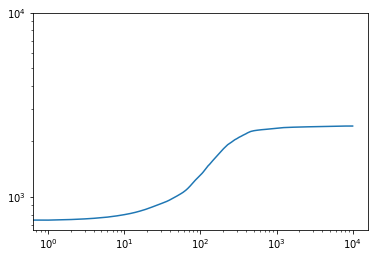

In [41]:
loglog(abs(np.array(losses)))

In [16]:
im1, _ = generative_model.apply(params, state, z[0:32])
im2, _ = generative_model.apply(params, state, z[32:64])

NameError: name 'z' is not defined

''

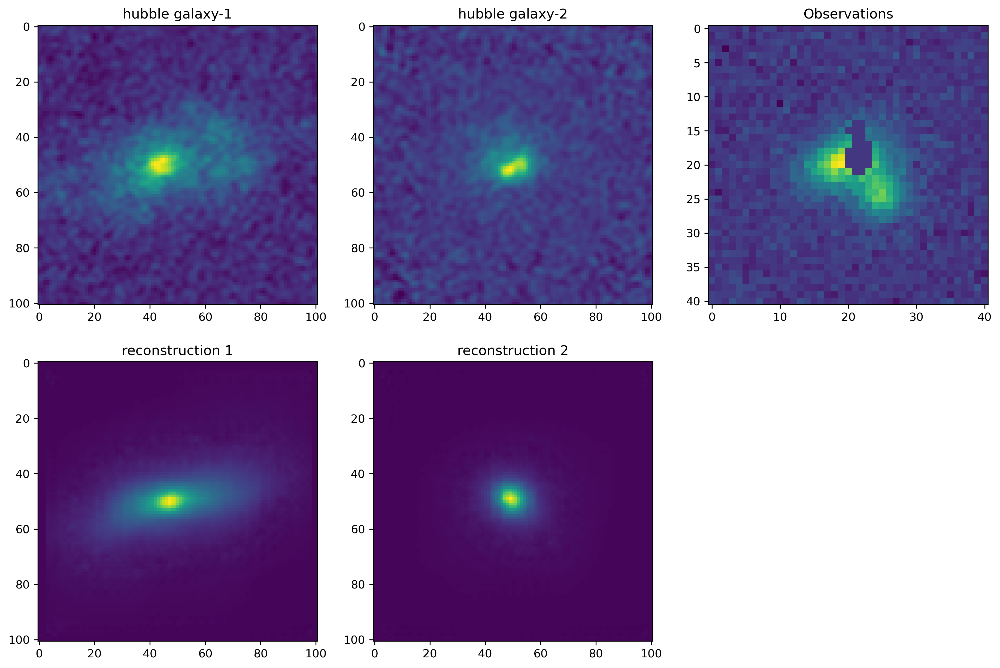

In [44]:
plt.rcParams['figure.dpi']=300
figure(figsize=[15,10])
subplot(231)
imshow(x1_true)
title('hubble galaxy-1')
subplot(232)
imshow(x2_true)
title('hubble galaxy-2')
subplot(233)
imshow(y_obs)
title('Observations')
subplot(234)
imshow(im1[0])
title('reconstruction 1')
subplot(235)
imshow(im2[0])
title('reconstruction 2')
;

In [17]:
# an affine flow converting z to any distribution we want
d = 64
class AffineCoupling_deblend(hk.Module):
  """This is the coupling layer used in the Flow."""
  def __init__(self, scale_only=True, **kwargs):
    super().__init__(**kwargs)
    self.scale_only = scale_only

  def __call__(self, x, output_units, **condition_kwargs):
    net = hk.Linear(128)(x)
    net = jax.nn.leaky_relu(net)
    net = hk.Linear(128)(net)
    net = jax.nn.leaky_relu(net)
    shifter = tfb.Shift(hk.Linear(output_units)(net))
    if self.scale_only:
      return shifter
    else:
      scaler = tfb.Scale(jnp.clip(jax.nn.softplus(hk.Linear(output_units)(net)), 1e-2, 1e1))
      return tfb.Chain([shifter, scaler])
    
class AffineFlow_deblend(hk.Module):
    """This is a normalizing flow using the coupling layers defined
    above."""
    def __call__(self):
        chain = tfb.Chain([
            tfb.RealNVP(d//2, bijector_fn=AffineCoupling_deblend(name='aff1')),
            tfb.Permute(np.arange(d)[::-1]),
            tfb.RealNVP(d//2, bijector_fn=AffineCoupling_deblend(name='aff2')),
            tfb.Permute(np.arange(d)[::-1]),
            tfb.RealNVP(d//2, bijector_fn=AffineCoupling_deblend(name='aff3',
                                                         scale_only=False)),
            tfb.Permute(np.arange(d)[::-1]),
            tfb.RealNVP(d//2, bijector_fn=AffineCoupling_deblend(name='aff4',
                                                         scale_only=False)),
            tfb.Permute(np.arange(d)[::-1]),
        ])
        
        nvp = tfd.TransformedDistribution(
            tfd.MultivariateNormalDiag(jnp.zeros(d),jnp.ones(d)),
            bijector=chain)
        return nvp

In [18]:
def sample_and_logp(N=1):
    flow = AffineFlow1()()
    z = flow.sample(N, seed=hk.next_rng_key())
    log_p = flow.log_prob(z)
    return z, log_p

In [19]:
q_sample_logp = hk.transform(sample_and_logp)

# We initialize the parameters for the variational distribution
q_params = q_sample_logp.init(next(rng_seq), 1)

# And here is our prior distribution
p = tfd.MultivariateNormalDiag(jnp.zeros(64), 
                               scale_identity_multiplier=1.)

/jet/home/dkn20/.local/lib/python3.7/site-packages/jax/_src/numpy/lax_numpy.py:5792: UserWarning: Explicitly requested dtype int64 requested in astype is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  lax._check_user_dtype_supported(dtype, "astype")


In [20]:
# Let's write a concrete ELBO
@jax.jit
def log_l(x):
    likelihood = tfd.Independent(tfd.Normal(x,
                                           jnp.sqrt(hsc['variance'] + cr_mask*1e3)), # We add a high noise component in mask
                             reinterpreted_batch_ndims=2)
    return likelihood.log_prob(y_obs)

@jax.jit
def elbo(params, rng_key):
    
    # Sample from the log posterior
    z, log_q = q_sample_logp.apply(params, rng_key, N=100)
    
    # KL term 
    kl = log_q - p.log_prob(z)
    vmap_batched_blend = jax.vmap(blending)
    x=vmap_batched_blend(z[...,0:32],z[...,32:64])
    
    #y_pred=jnp.zeros((100,101,101))
    #variance=jnp.zeros((100,101,101))
    #y_observe=jnp.zeros((100,101,101))
    vmap_batched_log_joint = jax.vmap(log_l)
    log_likelihood=vmap_batched_log_joint(x)
    
    #likelihood = tfd.Independent(tfd.Normal(y_pred,
                                            #variance), # We add a high noise component in mask
                             #reinterpreted_batch_ndims=2)
    
    # You need to plug your forward model producing a likelihood object here
    #likelihood = # .....
    
    #log_likelihood.log_prob(y_obs)
    
    # Form the ELBO
    elbo = jnp.mean(log_likelihood - kl)
    
    return -elbo

In [21]:
def lr_schedule(step):
  """Linear scaling rule optimized for 90 epochs."""
  steps_per_epoch = 40000 // 64 

  current_epoch = step / steps_per_epoch  # type: float
  boundaries = jnp.array((40, 80, 120)) * steps_per_epoch
  values = jnp.array([1., 0.1, 0.01, 0.001])

  index = jnp.sum(boundaries < step)
  return jnp.take(values, index)

In [22]:
# do the optimization
optimizer = optax.chain(
      optax.adam(1e-3),
      optax.scale_by_schedule(lr_schedule))

opt_state = optimizer.init(q_params)

In [23]:
@jax.jit
def update(params, rng_key, opt_state):
    """Single SGD update step."""
    logp, grads = jax.value_and_grad(elbo)(params, rng_key)
    updates, new_opt_state = optimizer.update(grads, opt_state)
    new_params = optax.apply_updates(params, updates)
    return logp, new_params, new_opt_state

In [24]:
%%time
losses=[]
for s in range(10000):
    logp, q_params, opt_state = update(q_params, next(rng_seq), opt_state)
    losses.append(logp)

CPU times: user 6min 22s, sys: 1min 4s, total: 7min 27s
Wall time: 8min 42s


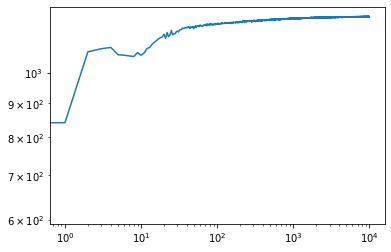

In [25]:
loglog(abs(np.array(losses)))

/opt/packages/AI/anaconda3-tf2.2020.11/lib/python3.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


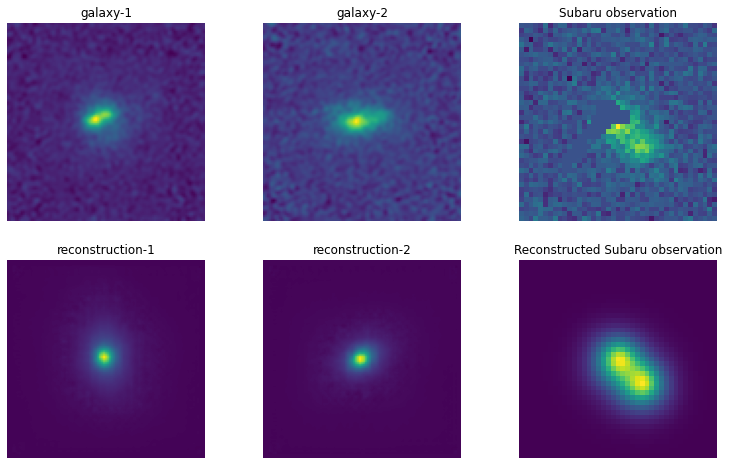

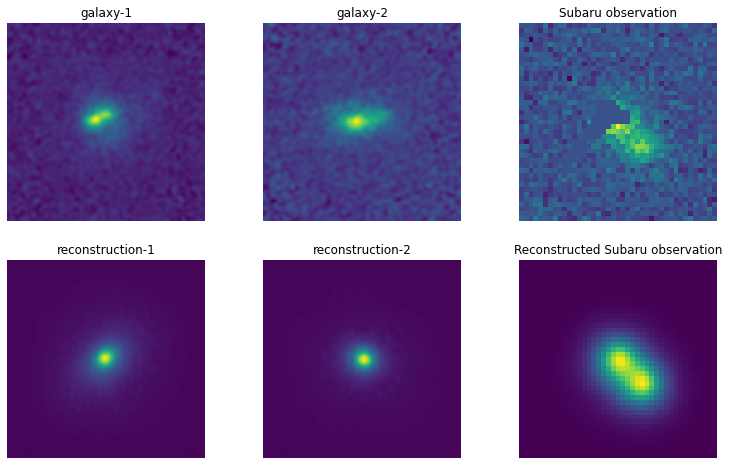

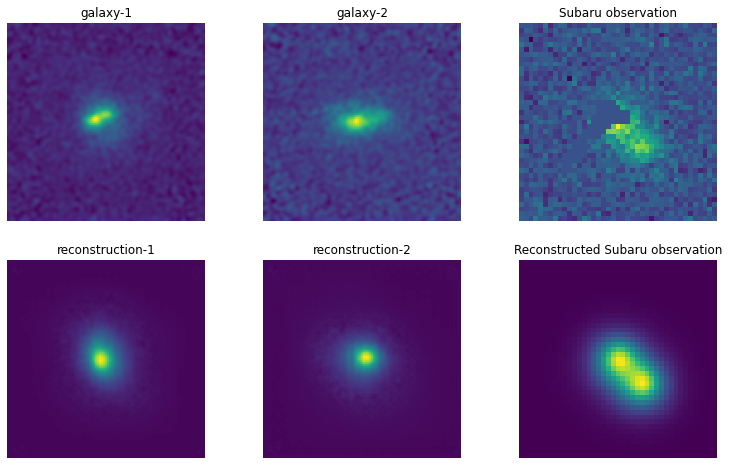

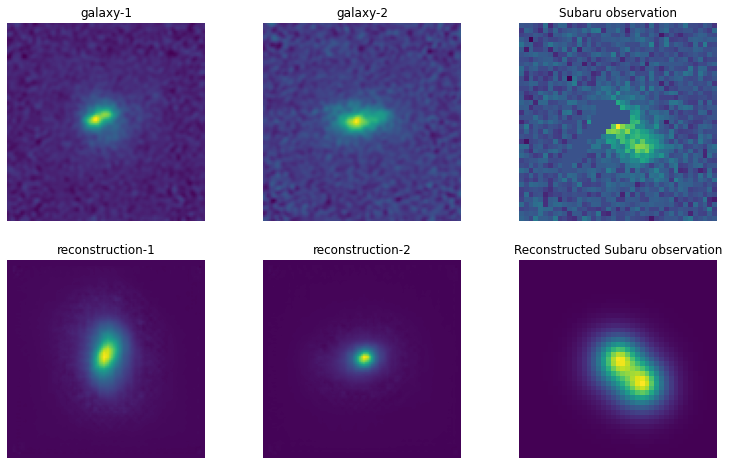

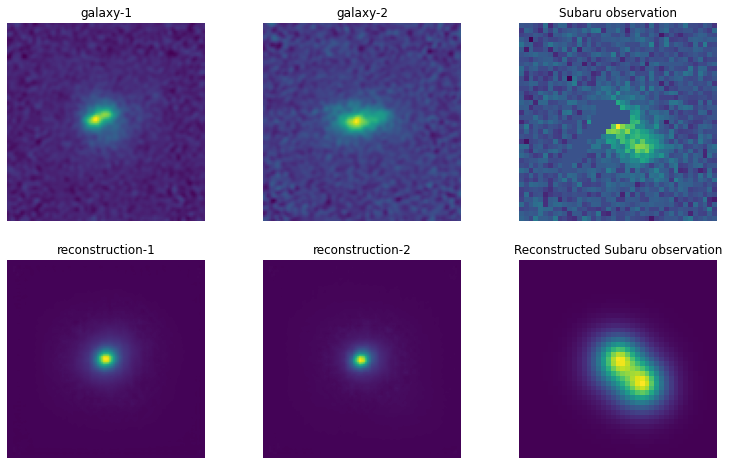

...

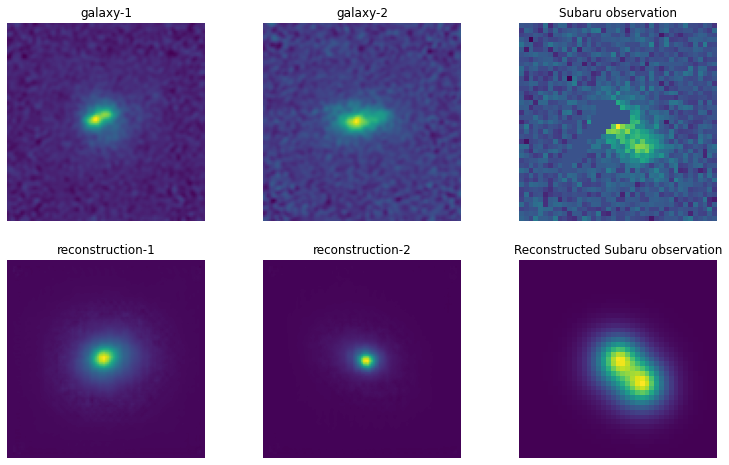

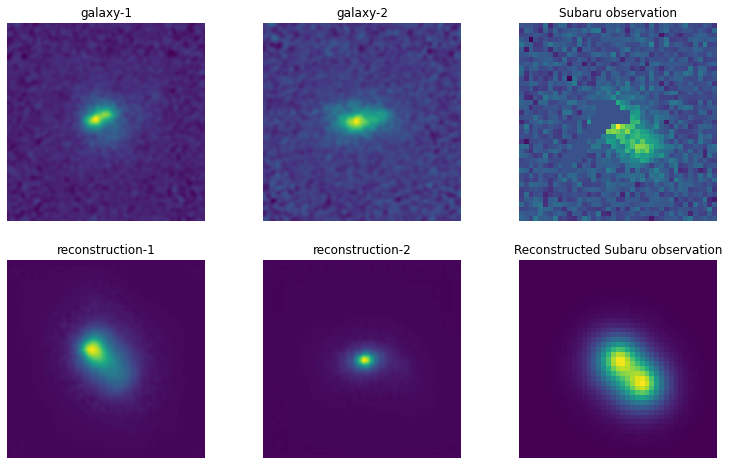

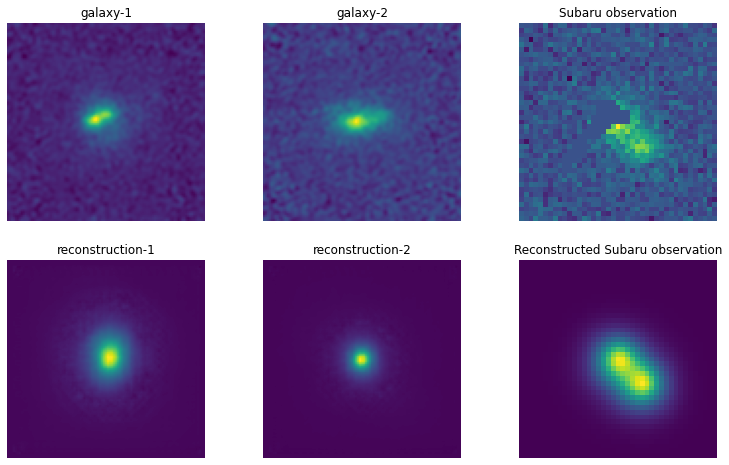

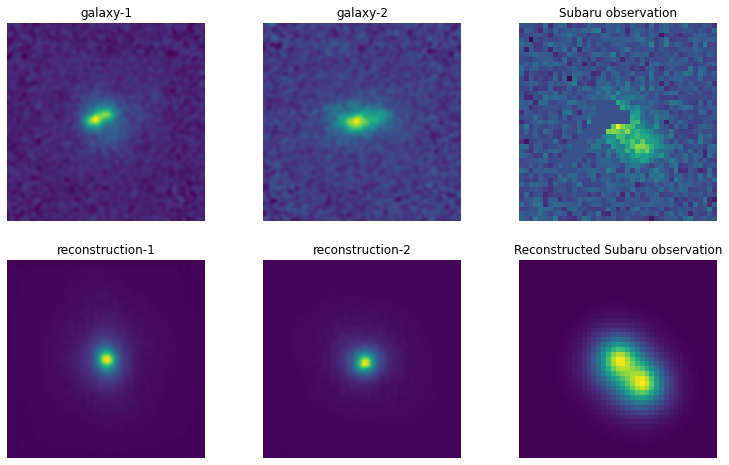

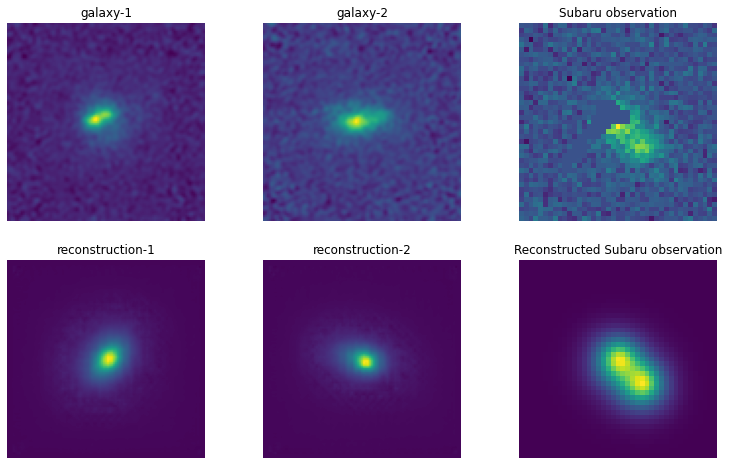

In [30]:
# create 100 samples
z, log_q = q_sample_logp.apply(q_params, next(rng_seq), N=500)
x1,_=generative_model.apply(params_1, state, z[...,0:32])
x2,_=generative_model.apply(params_1, state, z[...,32:64])

for i in range(100):
    figure(figsize=[13,8])
    subplot(231)
    imshow(x1_true)
    title('galaxy-1')
    axis('off')
    subplot(232)
    imshow(x2_true)
    title('galaxy-2')
    axis('off')
    subplot(233)
    imshow(y_obs)
    title('Subaru observation')
    axis('off')
    subplot(234)
    imshow(x1[i])
    title('reconstruction-1')
    axis('off')
    subplot(235)
    imshow(x2[i])
    title('reconstruction-2')
    axis('off')
    subplot(236)
    imshow(blending(x1[i],x2[i]))
    title('Reconstructed Subaru observation')
    axis('off')
    filename='figures/figure1_'+str(i)+'.png'
    plt.savefig(filename)
#save()

In [31]:
# code to make a mp4 file
import cv2,os
image_folder = 'figures/'
video_name = 'compare_deblending.mp4'

images = [f'figure1_{i}.png' for i in range(100)]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, cv2.VideoWriter_fourcc(*'MP4V'), 10, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()